# <span style="color:lightblue"><center> **CLASSIFICAÇÃO DOS EPISÓDIOS DE MORTE DECORRENTE DA CIRROSE**</center></span>

A seguir, vamos elaborar um processo de classificação com base no dataset [Liver Cirrhosis Stage Classification](https://www.kaggle.com/datasets/aadarshvelu/liver-cirrhosis-stage-classification), com o objetivo de classificar a coluna **"Situação"**. Ou seja, criaremos modelos com Regressão Logística, Árvore de Decisão e Rede Neural para identificar os casos de Sobrevivência, Morte e Transplante dos pacientes de cirrose, vistos na EDA.

Para isso, nós realizamos 3 classificações diferentes:

**1. Morte, Sobrevivência e Transplante**
- Essa primeira classificação contém as 3 classes, não modificamos nada no dataset. O ponto dela é ser capaz de distinguir os 3 casos individualmente.

**2. Mesclando Sobrevivência e Transplante**
- Aqui, nós juntamos as classes *Sobrevivência* e *Transplante* em uma só, com a finalidade de identificar binariamente a situação dos pacientes estudados: ou morto ou vivo.

**3. Ignorando Evento Transplante**
- Por último, fizemos uma classificação deixando de lado a classe *Transplante*, levando em consideração apenas os atributos dos pacientes que sobreviveram que não necessitaram da operação.

### Importando as Bibliotecas

In [122]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from joblib import dump
from sklearn import tree

### Importação dos Dados

* Antes de tudo vamos importar o csv "liver_cirrhosis_v3". Essa versão foi separada previamente durante a etapa de limpeza de dados, removendo algumas variáveis da tabela e deixando apenas as mais relevantes para a classificação de casos de morte. Esses atributos são:

    - `Situação (Sobreviveu, Transplante ou Morte)`
    - `Bilirrubina (mg/dl)`
    - `Albumina (gm/dl)`
    - `Fosfatase Alcalina (U/L)`
    - `Aspartato Aminotransferase (U/L)`
    - `Plaquetas (ml/1000)`
    - `Tempo de Protrombina (s)`
    - `Estágio (1, 2 ou 3)`

In [123]:
df = pd.read_csv("../data/dados_processados/liver_cirrhosis_v3.csv")

df

,Situação,Idade,Bilirrubina(mg/dl),Albumina(gm/dl),Fosfatase_Alcalina (U/L),Aspartato_Aminotransferase(U/L),Plaquetas(ml/1000),Tempo_de_Protrombina(s),Estágio
0,Sobreviveu,18499,0.5,4.04,598.000000,52.700000,256.0,9.9,1
1,Sobreviveu,19724,0.5,3.93,663.000000,45.000000,220.0,10.8,2
2,Sobreviveu,11839,0.5,3.54,1243.000000,122.450000,225.0,10.0,2
3,Morte,16467,0.7,3.74,1024.000000,77.500000,151.0,10.2,2
4,Morte,21699,1.9,3.54,1052.000000,108.500000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...
9632,Sobreviveu,17897,0.7,3.49,1982.655769,122.556346,243.0,9.7,1
9633,Sobreviveu,23376,1.8,3.24,1982.655769,122.556346,139.0,10.5,1
9634,Morte,24585,2.1,3.48,2045.000000,89.900000,412.0,11.8,3
9635,Sobreviveu,21324,0.9,3.40,1098.000000,122.450000,228.0,10.3,2


<br><br>

A seguir, a seção *Classificação 1* possui explicações detalhadas sobre cada trecho. Nas seções seguintes (*Classificação 2 e Classificação 3*) serão feitas as mesmas análises, porém com ajustes nas classes.

---
# Classificação 1: Morte, Sobrevivência e Transplante
---

## **Divisão para Treino/Teste**

* Com o dataset extraído, a próxima etapa será dividir as variáveis X e Y. Como queremos classificar a coluna "Situação" e prever os casos de "sobrevivência, morte e transplante", vamos definir essa coluna como sendo a Y. O resto das colunas usaremos como valores de entrada sendo a variável X

* Além disso, vamos também dividir cada uma de nossas variáveis em duas partes, uma fração para treinos e outra para testes. Nesse caso, decidimos dividir 80% dos valores para treino e o restante, que seria 20%, para os testes mais para frente. Perceba que esse dataset tem 9637 linhas, logo ficarão 7709 linhas para treino e 1928 para testes.

In [124]:
df1 = df.copy()

# Obtendo as variáveis x e y para treinar o modelo 
X1  = df1.drop(columns=['Situação']).values
y1 = df1['Situação'].values

# Dividindo 80% da matriz para treinar o modelo e 20% para os testes
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2)
print("Tamanho separado para treinos: " + str(len(X_train1)))
print("Tamanho separado para testes: " + str(len(X_test1)) + "\n")

print(X1)
print(y1)

Tamanho separado para treinos: 7709
Tamanho separado para testes: 1928

[[1.8499e+04 5.0000e-01 4.0400e+00 ... 2.5600e+02 9.9000e+00 1.0000e+00]
 [1.9724e+04 5.0000e-01 3.9300e+00 ... 2.2000e+02 1.0800e+01 2.0000e+00]
 [1.1839e+04 5.0000e-01 3.5400e+00 ... 2.2500e+02 1.0000e+01 2.0000e+00]
 ...
 [2.4585e+04 2.1000e+00 3.4800e+00 ... 4.1200e+02 1.1800e+01 3.0000e+00]
 [2.1324e+04 9.0000e-01 3.4000e+00 ... 2.2800e+02 1.0300e+01 2.0000e+00]
 [2.8650e+04 8.0000e-01 2.9400e+00 ... 9.7000e+01 1.1200e+01 3.0000e+00]]
['Sobreviveu' 'Sobreviveu' 'Sobreviveu' ... 'Morte' 'Sobreviveu' 'Morte']


## **Normalização dos Dados**

* Seguindo, agora é hora de normalizar os dados que separamos. Para isso é utilizado o objeto **StandardScaler** e seus métodos *fit_transform()* e *fit()*. Depois de ser aplicada a normalização, nós salvamos o scaler na pasta **scalers** com nome **death_scaler.joblib** para possíveis usos futuros.

In [125]:
# Normalizando os dados extraídos do dataset
scaler1 = StandardScaler()
X_train1 = scaler1.fit_transform(X_train1)
X_test1 = scaler1.transform(X_test1)

# Salvando o scaler para uso futuro
print("O modelo do scaler foi salvo em:")
dump(scaler1, 'scalers/death_scaler1.joblib')

O modelo do scaler foi salvo em:


['scalers/death_scaler1.joblib']

## **Regressão Logística**

* Nosso primeiro modelo de classificação será utilizando Regressão Logística. Vamos utilizar o objeto **Logistic Regression** e dar um *fit()* para poder treinar nosso modelo, e depois salvar a predição numa variável separada. Os resultados da regressão são exibidos através de uma tabela de resultados, com a precisão de cada classe e acurácia geral, e também uma matriz de confusão com as 3 classes.

* Por fim, o modelo de Regressão Logística é salvo na pasta **models** no arquivo nomeado **death_logreg.joblib** para que seja mais fácil de acessá-lo caso seja necessário.

In [126]:
logreg1 = LogisticRegression(max_iter=4000, n_jobs=-1, C=0.1, penalty='l2')
logreg1.fit(X_train1, y_train1)

# Predict do teste
y_pred1 = logreg1.predict(X_test1)

# Tabela de Resultados
print("Report - Regressão Logística:")
print(classification_report(y_test1, y_pred1, zero_division=0))

Report - Regressão Logística:
              precision    recall  f1-score   support

       Morte       0.71      0.57      0.63       740
  Sobreviveu       0.69      0.87      0.77      1059
 Transplante       0.00      0.00      0.00       129

    accuracy                           0.70      1928
   macro avg       0.47      0.48      0.47      1928
weighted avg       0.65      0.70      0.66      1928



In [127]:
# Importância dos coeficientes
coefficients1 = logreg1.coef_
importance1 = pd.DataFrame(coefficients1.T, columns = logreg1.classes_, index=df1.drop('Situação', axis=1).columns)
print("\nImportância dos coeficientes:")
print(importance1)


Importância dos coeficientes:
                                    Morte  Sobreviveu  Transplante
Idade                            0.131393    0.033408    -0.164801
Bilirrubina(mg/dl)               0.554362   -0.772821     0.218459
Albumina(gm/dl)                 -0.127062    0.089360     0.037701
Fosfatase_Alcalina (U/L)         0.302655    0.045932    -0.348587
Aspartato_Aminotransferase(U/L)  0.084521   -0.144707     0.060186
Plaquetas(ml/1000)               0.000979   -0.055471     0.054492
Tempo_de_Protrombina(s)          0.140086   -0.125633    -0.014454
Estágio                          0.137375   -0.204608     0.067233


<Figure size 600x600 with 0 Axes>

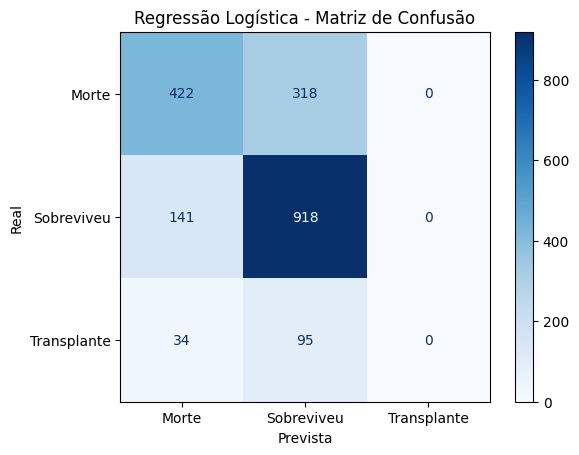

In [128]:
# Matriz de Confusão
matrix1 = confusion_matrix(y_test1, y_pred1)

plt.figure(figsize=(6, 6))

matrixPlot1 = ConfusionMatrixDisplay(confusion_matrix=matrix1, display_labels=logreg1.classes_)
matrixPlot1.plot(cmap=plt.cm.Blues)

plt.title('Regressão Logística - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

In [129]:
# Salvando o modelo de regressão para uso futuro
print("O modelo de Regressão Logística foi salvo em:")
dump(logreg1, 'models/death_logreg1.joblib')

O modelo de Regressão Logística foi salvo em:


['models/death_logreg1.joblib']

## **Árvore de Decisão**

* Agora vamos tentar outra alternativa de classificação. Dessa vez, vamos tentar utilizar o algoritmo de Árvore de Decisão, que pode ser útil para nos ajudar a visualizar melhor o que está acontecendo no processo de classificação, e talvez até entregue resultados melhores na acurácia e precisão. 

* Perceba que podemos utilizar as mesmas variáveis X e Y, já que não foram modificadas.

In [130]:
# Instanciar a Árvore de Decisão
clf1 = DecisionTreeClassifier(criterion='entropy', max_depth=8, min_samples_leaf=5)

clf1.fit(X_train1, y_train1)

# Predict da Árvore de Decisão
tree_pred1 = clf1.predict(X_test1)

# Tabela de Resultados
print("Report - Árvore de Decisão:")
print(classification_report(y_test1, tree_pred1, zero_division=0))

Report - Árvore de Decisão:
              precision    recall  f1-score   support

       Morte       0.82      0.76      0.79       740
  Sobreviveu       0.82      0.90      0.86      1059
 Transplante       0.93      0.63      0.75       129

    accuracy                           0.83      1928
   macro avg       0.86      0.76      0.80      1928
weighted avg       0.83      0.83      0.82      1928



* Perceba que a acurácia aumentou consideravelmente, de ~70% para ~80%. Além disso, a classe **Transplante** que antes estava sendo omitida da classificação agora está sendo classificada corretamente. Maravilha!

* Agora vamos plottar a nossa árvore de decisão, para que possamos visualizar as etapas que o modelo tomou para alcançar tais resultados.

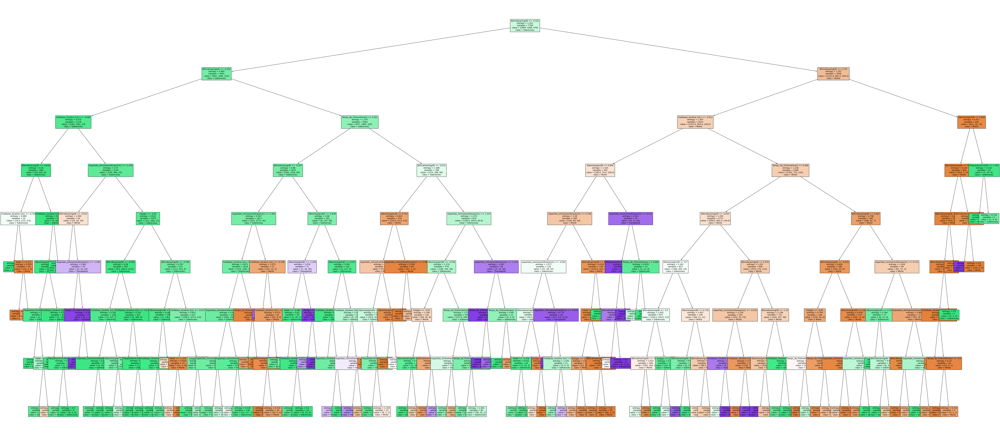

In [131]:
# Plottar a Árvore de Decisão
fig1 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf1,
                      feature_names=df1.drop(columns=['Situação']).columns,
                      class_names=clf1.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

## **Correção na Árvore de Decisão**

* A nossa árvore de decisão está entregando bons resultados, mas está bem ilegível. Para corrigir isso, vamos modificar alguns parâmetros para que a análise fique mais sucinta (e de fato possível).

* Primeiramente, vamos realizar uma *Grid Search* para encontrar o melhor valor para **ccp_alpha**, um parâmetro que nos ajuda a regularizar a árvore.

In [132]:
# Grid Search
path1 = clf1.cost_complexity_pruning_path(X_train1, y_train1)

param_grid1 = {'ccp_alpha': path1.ccp_alphas}

CV_clf = GridSearchCV(estimator=clf1, param_grid=param_grid1, cv = 7, verbose=2, n_jobs=-1)
CV_clf.fit(X_train1, y_train1)

best_ccp_alpha1 = CV_clf.best_estimator_.ccp_alpha

Fitting 7 folds for each of 109 candidates, totalling 763 fits


* Com o valor em mãos, agora vamos criar outra árvore de decisão com os parâmetros modifiados, com o objetivo de torná-la mais agradável esteticamente sem que haja uma diminuição muito grande da acurácia.

In [133]:
# Instanciar um novo objeto para a Árvore de Decisão Corrigida
clf_ccp1 = DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=4, min_samples_split=20, ccp_alpha=best_ccp_alpha1)

clf_ccp1.fit(X_train1, y_train1)

# Predict da Árvore de Decisão Corrigida
tree_pred1 = clf_ccp1.predict(X_test1)

# Tabela de Resultados
print("Report - Árvore de Decisão Corrigida:")
print(classification_report(y_test1, tree_pred1, zero_division=0))

Report - Árvore de Decisão Corrigida:
              precision    recall  f1-score   support

       Morte       0.77      0.71      0.73       740
  Sobreviveu       0.79      0.88      0.83      1059
 Transplante       0.93      0.50      0.65       129

    accuracy                           0.79      1928
   macro avg       0.83      0.69      0.74      1928
weighted avg       0.79      0.79      0.78      1928



In [134]:
# Importância dos coeficientes
importances1 = clf_ccp1.feature_importances_
feature_importances1 = pd.DataFrame(
    importances1,
    columns = ['Importance'],
    index=df1.drop('Situação', axis=1).columns
).sort_values(by='Importance', ascending=False)

print("\nImportância das Features:")
print(feature_importances1)


Importância das Features:
                                 Importance
Bilirrubina(mg/dl)                 0.629533
Aspartato_Aminotransferase(U/L)    0.125854
Albumina(gm/dl)                    0.105254
Fosfatase_Alcalina (U/L)           0.068814
Tempo_de_Protrombina(s)            0.051290
Estágio                            0.018588
Plaquetas(ml/1000)                 0.000668
Idade                              0.000000


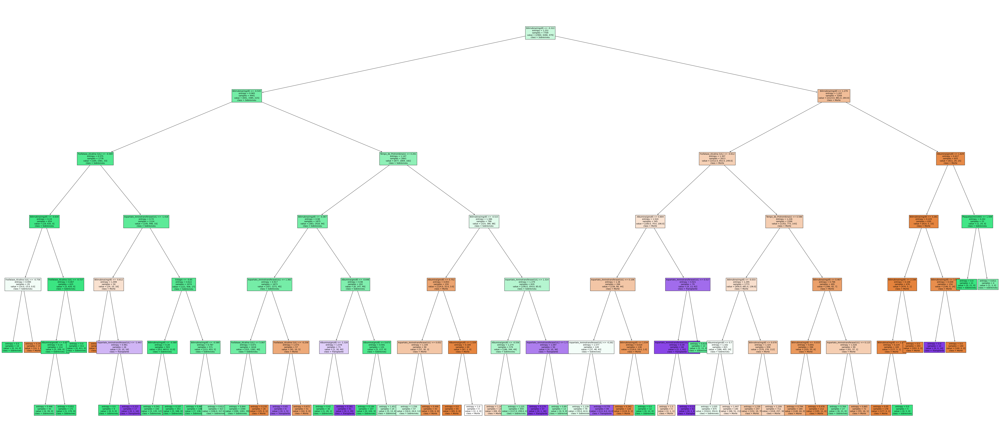

In [135]:
# Árvore de Decisão Corrigida
fig_1 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf_ccp1,
                      feature_names=df1.drop(columns=['Situação']).columns,
                      class_names=clf_ccp1.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

* E para finalizar, vamos salvar arquivos dos nossos modelos de árvore de decisão para que possamos usá-las em outra situação.

In [136]:
# Salvando os modelos de árvore de decisão para uso futuro
print("O modelo de Árvore de Decisão foi salvo em:")
dump(clf1, 'models/death_tree1.joblib')

O modelo de Árvore de Decisão foi salvo em:


['models/death_tree1.joblib']

In [137]:
print("O modelo de Árvore de Decisão Corrigida foi salvo em:")
dump(clf_ccp1, 'models/death_tree_fixed1.joblib')

O modelo de Árvore de Decisão Corrigida foi salvo em:


['models/death_tree_fixed1.joblib']

---
# Classificação 2: Mesclando Sobrevivência e Transplante
---

## **Importação e Ajuste dos Dados**

In [138]:
df2 = df.copy()

# Considerando o valor de "Transplante" como "Sobreviveu"
df2['Situação'] = df2['Situação'].replace('Transplante', 'Sobreviveu')

print(df2['Situação'].value_counts())
df2

Situação
Sobreviveu    5933
Morte         3704
Name: count, dtype: int64


,Situação,Idade,Bilirrubina(mg/dl),Albumina(gm/dl),Fosfatase_Alcalina (U/L),Aspartato_Aminotransferase(U/L),Plaquetas(ml/1000),Tempo_de_Protrombina(s),Estágio
0,Sobreviveu,18499,0.5,4.04,598.000000,52.700000,256.0,9.9,1
1,Sobreviveu,19724,0.5,3.93,663.000000,45.000000,220.0,10.8,2
2,Sobreviveu,11839,0.5,3.54,1243.000000,122.450000,225.0,10.0,2
3,Morte,16467,0.7,3.74,1024.000000,77.500000,151.0,10.2,2
4,Morte,21699,1.9,3.54,1052.000000,108.500000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...
9632,Sobreviveu,17897,0.7,3.49,1982.655769,122.556346,243.0,9.7,1
9633,Sobreviveu,23376,1.8,3.24,1982.655769,122.556346,139.0,10.5,1
9634,Morte,24585,2.1,3.48,2045.000000,89.900000,412.0,11.8,3
9635,Sobreviveu,21324,0.9,3.40,1098.000000,122.450000,228.0,10.3,2


* Junção dos dados de sobrevivência e transplante em uma única classe

## **Separação e Normalização dos Dados**

In [139]:
X2 = df2.iloc[:, 1:].values
y2 = df2.iloc[:, 0].values

In [140]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=0)

scaler2 = StandardScaler()
scaler2.fit(X_train2)
X_train2 = scaler2.transform(X_train2)
X_test2 = scaler2.transform(X_test2)

print("Tamanho treinamento: " + str(len(X_train2)))
print("Tamanho teste: " + str(len(X_test2)))

Tamanho treinamento: 7709
Tamanho teste: 1928


In [141]:
print("O modelo do scaler foi salvo em:")
dump(scaler2, 'scalers/death_scaler2.joblib')

O modelo do scaler foi salvo em:


['scalers/death_scaler2.joblib']

## **Regressão Logistica**

In [142]:
# Agora, começar de fato a regressão logística
logreg2 = LogisticRegression(max_iter=4000, n_jobs=-1, C=0.1, penalty='l2')
logreg2.fit(X_train2, y_train2)

# Predict do teste
y_pred2 = logreg2.predict(X_test1)

# Tabela de Resultados
print("Report - Regressão Logística:")
print(classification_report(y_test2, y_pred2, zero_division=0))

Report - Regressão Logística:
              precision    recall  f1-score   support

       Morte       0.38      0.26      0.31       758
  Sobreviveu       0.60      0.72      0.66      1170

    accuracy                           0.54      1928
   macro avg       0.49      0.49      0.48      1928
weighted avg       0.51      0.54      0.52      1928



In [143]:
# Importância dos coeficientes
feature_names2 = df2.columns[1:]
coefficients2 = logreg2.coef_
coef_df2 = pd.DataFrame(coefficients2, columns=feature_names2)
for i, class_name in enumerate(logreg2.classes_):
    sorted_coef2 = coef_df2.iloc[i].sort_values(ascending=False)
    print(f"Importância das Features em relação a {class_name}:\n")
    print(sorted_coef2)
    break

Importância das Features em relação a Morte:

Albumina(gm/dl)                    0.207232
Plaquetas(ml/1000)                -0.068144
Idade                             -0.104568
Aspartato_Aminotransferase(U/L)   -0.216628
Fosfatase_Alcalina (U/L)          -0.254859
Tempo_de_Protrombina(s)           -0.268722
Estágio                           -0.317740
Bilirrubina(mg/dl)                -1.087377
Name: 0, dtype: float64


<Figure size 600x600 with 0 Axes>

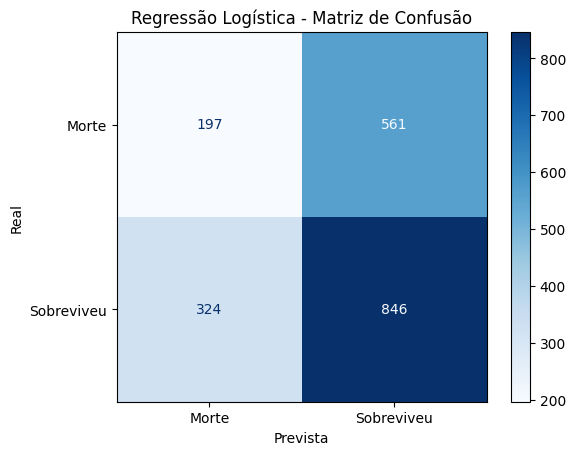

In [144]:
# Matriz de Confusão
matrix2 = confusion_matrix(y_test2, y_pred2)

plt.figure(figsize=(6, 6))

matrixPlot2 = ConfusionMatrixDisplay(confusion_matrix=matrix2, display_labels=logreg2.classes_)
matrixPlot2.plot(cmap=plt.cm.Blues)

plt.title('Regressão Logística - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

In [145]:
# Salvando o modelo de regressão para uso futuro
print("O modelo de Regressão Logística foi salvo em:")
dump(logreg2, 'models/death_logreg2.joblib')

O modelo de Regressão Logística foi salvo em:


['models/death_logreg2.joblib']

## **Árvore de Decisão**

In [146]:
# Instanciar a Árvore de Decisão
clf2 = DecisionTreeClassifier(criterion='entropy', max_depth=8, min_samples_leaf=5)

clf2.fit(X_train2, y_train2)

# Predict da Árvore de Decisão
tree_pred2 = clf2.predict(X_test2)

# Tabela de Resultados
print("Report - Árvore de Decisão:")
print(classification_report(y_test2, tree_pred2, zero_division=0))

Report - Árvore de Decisão:
              precision    recall  f1-score   support

       Morte       0.82      0.79      0.80       758
  Sobreviveu       0.87      0.89      0.88      1170

    accuracy                           0.85      1928
   macro avg       0.84      0.84      0.84      1928
weighted avg       0.85      0.85      0.85      1928



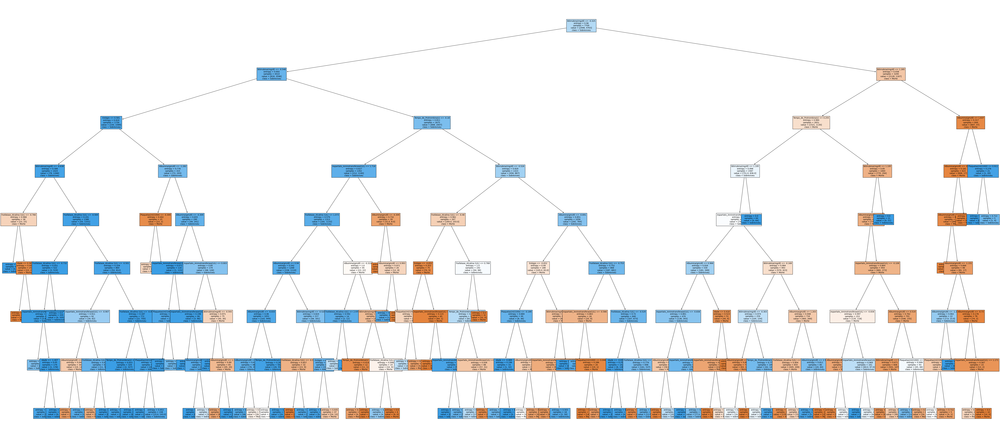

In [147]:
# Plottar a Árvore de Decisão
fig2 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf2,
                      feature_names=df2.drop(columns=['Situação']).columns,
                      class_names=clf2.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

## **Correção na Árvore de Decisão**

In [148]:
# Grid Search
path2 = clf2.cost_complexity_pruning_path(X_train2, y_train2)

param_grid2 = {'ccp_alpha': path2.ccp_alphas}

CV_clf = GridSearchCV(estimator=clf2, param_grid=param_grid2, cv = 7, verbose=2, n_jobs=-1)
CV_clf.fit(X_train2, y_train2)

best_ccp_alpha2 = CV_clf.best_estimator_.ccp_alpha

Fitting 7 folds for each of 75 candidates, totalling 525 fits


In [149]:
# Instanciar um novo objeto para a Árvore de Decisão Corrigida
clf_ccp2 = DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=4, min_samples_split=20, ccp_alpha=best_ccp_alpha2)

clf_ccp2.fit(X_train2, y_train2)

# Predict da Árvore de Decisão Corrigida
tree_pred2 = clf_ccp2.predict(X_test2)

# Tabela de Resultados
print("Report - Árvore de Decisão Corrigida:")
print(classification_report(y_test2, tree_pred2, zero_division=0))

Report - Árvore de Decisão Corrigida:
              precision    recall  f1-score   support

       Morte       0.74      0.72      0.73       758
  Sobreviveu       0.82      0.84      0.83      1170

    accuracy                           0.79      1928
   macro avg       0.78      0.78      0.78      1928
weighted avg       0.79      0.79      0.79      1928



In [150]:
# Importância dos coeficientes
importances2 = clf_ccp2.feature_importances_
feature_importances2 = pd.DataFrame(
    importances2, columns = ['Importance'], index=df2.drop('Situação', axis=1).columns).sort_values(by='Importance', ascending=False)

print("\nImportância das Features:")
print(feature_importances2)


Importância das Features:
                                 Importance
Bilirrubina(mg/dl)                 0.616463
Albumina(gm/dl)                    0.137915
Fosfatase_Alcalina (U/L)           0.078506
Tempo_de_Protrombina(s)            0.067485
Aspartato_Aminotransferase(U/L)    0.066539
Estágio                            0.028719
Plaquetas(ml/1000)                 0.002455
Idade                              0.001917


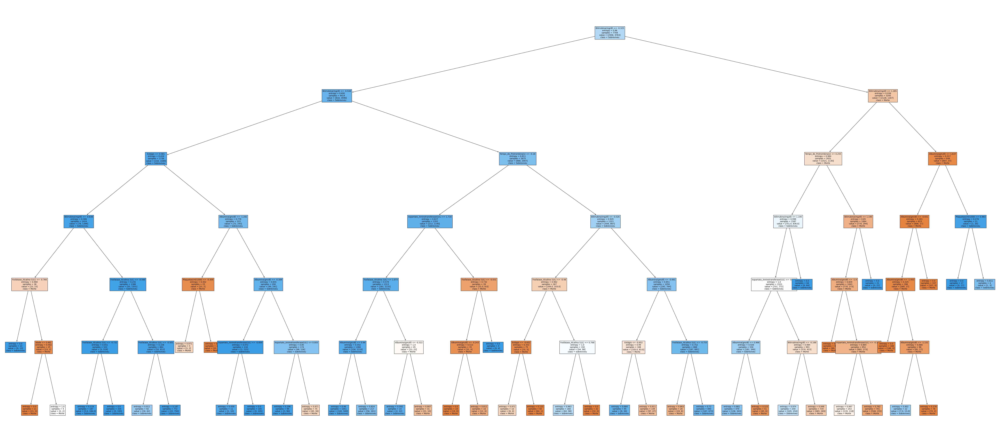

In [151]:
# Árvore de Decisão Corrigida
fig_2 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf_ccp2,
                      feature_names=df2.drop(columns=['Situação']).columns,
                      class_names=clf_ccp2.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

In [152]:
# Salvando os modelos de árvore de decisão para uso futuro
print("O modelo de Árvore de Decisão foi salvo em:")
print(dump(clf2, 'models/death_tree2.joblib'))

print("\nO modelo de Árvore de Decisão Corrigida foi salvo em:")
print(dump(clf_ccp2, 'models/death_tree_fixed2.joblib'))

O modelo de Árvore de Decisão foi salvo em:
['models/death_tree2.joblib']

O modelo de Árvore de Decisão Corrigida foi salvo em:
['models/death_tree_fixed2.joblib']


---
# Classificação 3: Ignorando Evento Transplante
---

## **Importação e Ajuste dos Dados**

In [153]:
df3 = df.copy()

# Retira as linhas que possuem a coluna 'Situação' com o valor 'Transplante'
df3 = df3[df3['Situação'] != 'Transplante']

# Transforma a coluna 'Situação' em binário
df3['Situação'] = df3['Situação'].replace({'Morte': 1, 'Sobreviveu': 0})

# Renomeia a coluna 'Situação' para 'Morte'
df3 = df3.rename(columns={'Situação': 'Morte'})

# Mostra as primeiras linhas do dataset
df3

C:\Users\jakel\AppData\Local\Temp\ipykernel_11476\771282344.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df3['Situação'] = df3['Situação'].replace({'Morte': 1, 'Sobreviveu': 0})


,Morte,Idade,Bilirrubina(mg/dl),Albumina(gm/dl),Fosfatase_Alcalina (U/L),Aspartato_Aminotransferase(U/L),Plaquetas(ml/1000),Tempo_de_Protrombina(s),Estágio
0,0,18499,0.5,4.04,598.000000,52.700000,256.0,9.9,1
1,0,19724,0.5,3.93,663.000000,45.000000,220.0,10.8,2
2,0,11839,0.5,3.54,1243.000000,122.450000,225.0,10.0,2
3,1,16467,0.7,3.74,1024.000000,77.500000,151.0,10.2,2
4,1,21699,1.9,3.54,1052.000000,108.500000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...
9632,0,17897,0.7,3.49,1982.655769,122.556346,243.0,9.7,1
9633,0,23376,1.8,3.24,1982.655769,122.556346,139.0,10.5,1
9634,1,24585,2.1,3.48,2045.000000,89.900000,412.0,11.8,3
9635,0,21324,0.9,3.40,1098.000000,122.450000,228.0,10.3,2


* Retirada dos dados que possuiam Transplante na Situação
* Substituição dos dados, Morte = 1 e Sobreviveu = 0
* Mudança no nome da coluna de Situação para Morte

## **Separação e Normalização de dados**

In [154]:
# Definição das variáveis independentes e dependentes
X = np.array(df3[['Idade','Bilirrubina(mg/dl)','Albumina(gm/dl)','Fosfatase_Alcalina (U/L)','Aspartato_Aminotransferase(U/L)','Plaquetas(ml/1000)','Tempo_de_Protrombina(s)','Estágio']])
Y = np.array(df3['Morte'])

# Divisão dos dados em treino e teste (80% treino e 20% teste)
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2)

# Normalização dos Dados                                                              
scaler3 = StandardScaler()
scaler3.fit(x_train)
x_test = scaler3.transform(x_test)
x_train = scaler3.transform(x_train)

# Mostra o tamanho dos dados de treino e teste
print("Tamanho treinamento: " + str(len(x_train)))
print("Tamanho teste: " + str(len(x_test)))


Tamanho treinamento: 7223
Tamanho teste: 1806


In [155]:
# Salva o scaler
print("O modelo do scaler foi salvo em: ")
dump(scaler3, 'scalers/death_scaler3.joblib')

O modelo do scaler foi salvo em: 


['scalers/death_scaler3.joblib']

* Divisão dos dados para treino e Teste 
* Normalização para que a distribuição do teste fique próxima da do treino
* Salva Scaler

## **Regressão Logística**

In [156]:
# Transformando o Label para Morte e Sobreviveu
lrY_train = ['Morte' if value == 1 else 'Sobreviveu' for value in y_train]
lrY_test = ['Morte' if value == 1 else 'Sobreviveu' for value in y_test]

# Instancia Regressão Logistica
logreg3 = LogisticRegression(max_iter=5000, n_jobs=-1)

# Fit do Classificador
logreg3.fit(x_train, lrY_train)

LogisticRegression(max_iter=5000, n_jobs=-1)

In [157]:
# Erro do treino
N_inputs = len(lrY_train)

# Predição do treino
class_pred = logreg3.predict(x_train)

# Contador de erro
eIn = 0

# Calculando o erro
for i in range(N_inputs):
    # Se a classe predita for diferente da classe real, some 1 ao erro
    if(class_pred[i] != lrY_train[i]):
        eIn += 1

# Calculando a porcentagem de erro
eIn /= N_inputs

# Erro do teste
N_out = len(lrY_test)

# Realiza Predição no teste :
class_pred = logreg3.predict(x_test)

# Contador de erro
eOut = 0
for i in range(N_out):
    # Se a classe predita for diferente da classe real, some 1 ao erro
    if(class_pred[i] != lrY_test[i]):
        eOut += 1

# Calculando a porcentagem de erro
eOut /= N_out


# Mostra o erro no teste
print("Porcentagem de erro: ")
print("Eout = " + str(eOut))  # Erro no teste
# Mostra o erro no treino
print("Ein = " + str(eIn))

# Tabela de Resultados
print("\nReport - Regressão Logística:")
print(classification_report(lrY_test, class_pred))


Porcentagem de erro: 
Eout = 0.2497231450719823
Ein = 0.2528035442336979

Report - Regressão Logística:
              precision    recall  f1-score   support

       Morte       0.78      0.56      0.65       755
  Sobreviveu       0.74      0.89      0.81      1051

    accuracy                           0.75      1806
   macro avg       0.76      0.72      0.73      1806
weighted avg       0.76      0.75      0.74      1806



In [158]:
# Importância dos coeficientes
feature_names3 = df3.columns[1:]
coefficients3 = logreg3.coef_
coef_df3 = pd.DataFrame(coefficients3, columns=feature_names3)
for idx, class_name in enumerate(logreg2.classes_):
    sorted_coef3 = coef_df3.iloc[idx].sort_values(ascending=False)
    print(f"Importância das Features em relação a {class_name}:\n")
    print(sorted_coef3)
    break

Importância das Features em relação a Morte:

Albumina(gm/dl)                    0.206531
Plaquetas(ml/1000)                -0.088860
Idade                             -0.101165
Aspartato_Aminotransferase(U/L)   -0.207320
Fosfatase_Alcalina (U/L)          -0.255895
Tempo_de_Protrombina(s)           -0.261523
Estágio                           -0.307453
Bilirrubina(mg/dl)                -1.298169
Name: 0, dtype: float64


In [159]:
# Salva o modelo 
print("O modelo de Regressão Logística foi salvo em:")
dump(logreg3, 'models/death_logreg3.joblib')


O modelo de Regressão Logística foi salvo em:


['models/death_logreg3.joblib']

* Porcentagem de erro do teste e de treino próximas.
* Acurácia em torno de 73, porém a revocação para a classse morte é baixa indicando um deficit para a classificação do evento morte.


### **Matriz de Confusão**

[[422 333]
 [118 933]]


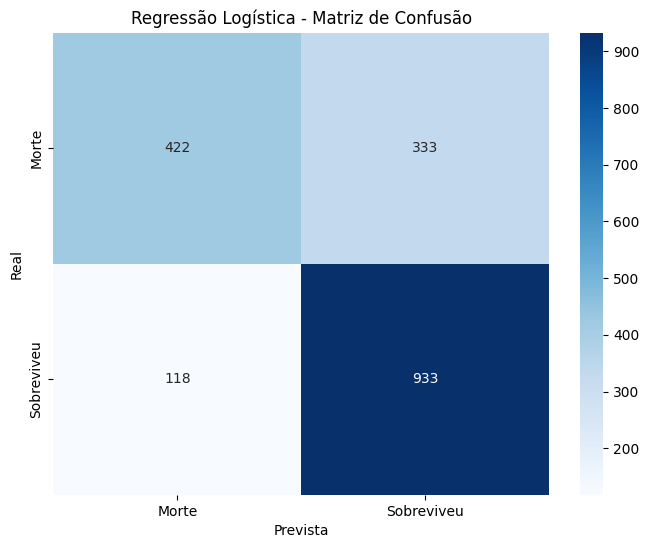

In [160]:
# Cria a matriz de confusão
cm = confusion_matrix(lrY_test, class_pred)
print(cm)

# Plota a matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Morte', 'Sobreviveu'], yticklabels=['Morte', 'Sobreviveu'])
plt.xlabel('Prevista')
plt.ylabel('Real')
plt.title('Regressão Logística - Matriz de Confusão')

# Mostra a matriz de confusão
plt.show()

De Cima Para Baixo da Esquerda para a Direita:
* True Positive (Previsto como Sobreviveu e era Sobreviveu)
* False Negative (Previsto como Morte mas era Sobreviveu)
* False Positive (Previsto como Sobreviveu mas era Morte) 
* True Negative (Previsto como Morte e era Morte) 

## **Árvore de Decisão**

In [161]:
# Instanciar a árvore de decisão
arvore_decisao = DecisionTreeClassifier()

# Ajustar o modelo (fit)
arvore_decisao.fit(x_train, lrY_train)

# Fazer previsões
class_pred_arvore = arvore_decisao.predict(x_test)

# Imprimir o relatório de classificação
print("Report - Árvore de Decisão:")
print(classification_report(lrY_test, class_pred_arvore))


Report - Árvore de Decisão:
              precision    recall  f1-score   support

       Morte       0.91      0.93      0.92       755
  Sobreviveu       0.95      0.93      0.94      1051

    accuracy                           0.93      1806
   macro avg       0.93      0.93      0.93      1806
weighted avg       0.93      0.93      0.93      1806



* Acurácia em torno de 93% indicando uma melhora em relação à Regressão Logística
* Médias e Revocação Indicam que o modelo está Balanceado.

### Minimal Cost Complexity Pruning

In [162]:
# Importação do classificador de Árvore de Decisão
clf3 = DecisionTreeClassifier()

# Cálculo do Caminho de Poda de Complexidade de Custos
path = clf3.cost_complexity_pruning_path(x_train, y_train)

# Definição do Grid de Parâmetros para a busca em grade
param_grid = {'ccp_alpha': path.ccp_alphas}

# Configuração da Validação Cruzada com GridSearchCV
CV_clf3 = GridSearchCV(estimator=clf3, param_grid=param_grid, cv = 7, verbose=2, n_jobs=-1)

# Treinamento do Modelo com GridSearchCV
CV_clf3.fit(x_train, y_train)

# Melhor valor de ccp_alpha
ccp_alpha = CV_clf3.best_params_['ccp_alpha']


Fitting 7 folds for each of 270 candidates, totalling 1890 fits


In [163]:
# Cria uma nova árvore de decisão com o melhor ccp_alpha e definindo limite e niveis
nova_arvore = DecisionTreeClassifier(ccp_alpha=ccp_alpha, criterion='entropy', max_depth=8, min_samples_leaf=5)

# Ajusta a nova árvore aos dados de treinamento
nova_arvore.fit(x_train, lrY_train)

# Faz previsões com a nova árvore
class_pred_arvore = nova_arvore.predict(x_test)

# Imprime o relatório de classificação
print(classification_report(lrY_test, class_pred_arvore))

              precision    recall  f1-score   support

       Morte       0.89      0.79      0.84       755
  Sobreviveu       0.86      0.93      0.89      1051

    accuracy                           0.87      1806
   macro avg       0.87      0.86      0.87      1806
weighted avg       0.87      0.87      0.87      1806



* Acurácia em torno de 84% (possivelmente devido ao limite de niveis)
* Revocação e médias indica balanceamento entre as classes

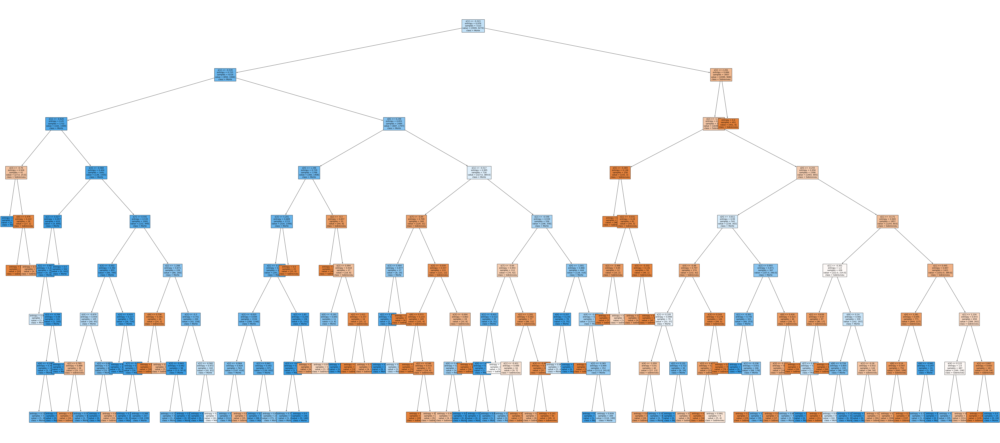

In [164]:
# Cria uma figura para a árvore
plt.figure(figsize=(90, 40))

# Plota a árvore 
plot_tree(nova_arvore, filled=True, class_names=["Sobreviveu", "Morte"], fontsize=10)

# Mostra o gráfico
plt.show()

* A Imagem acima mostra a forma que a árvore de decisão funciona.

In [165]:
# Salvando os modelos de árvore de decisão para uso futuro
print("O modelo de Árvore de Decisão foi salvo em:")
print(dump(arvore_decisao, 'models/death_tree3.joblib'))

print("\nO modelo de Árvore de Decisão Corrigida foi salvo em:")
print(dump(nova_arvore, 'models/death_tree_fixed3.joblib'))

O modelo de Árvore de Decisão foi salvo em:
['models/death_tree3.joblib']

O modelo de Árvore de Decisão Corrigida foi salvo em:
['models/death_tree_fixed3.joblib']
